Note: Interactive features like plotly_express won't work on GitHub.com. Paste link in https://nbviewer.org to view.

In [1]:
# Importing Basic Packages

import csv
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
pd.set_option('display.max_columns', 50)
warnings.filterwarnings("ignore")

In [2]:
# Importing Plotly Packages

import plotly 
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

In [3]:
# Importing sklearn Packages

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, linear_kernel

In [4]:
# Importing scipy Packages
from scipy.sparse.linalg import svds

In [5]:
data_path = "../../../yelp_dataset/"

In [6]:
# Reading in Reviews CSV File

final_reviews = pd.read_csv(data_path + "final_reviews.csv")
final_reviews.drop(['Unnamed: 0'], axis=1, inplace = True)
print(final_reviews.shape)
final_reviews.sample(5)

(345261, 23)


,review_id,user_id,business_id,stars,text,date,year,month,time,word_count,char_count,avg_word_len,stopword_count,cleaned_text,polarity,subjectivity,neg,neu,pos,compound,Dominant_Topic,Keywords,Text_Chunks
61620,k_Ec416Tuoz1oJ0sSB9w5A,W7vcdYwh8x_2xAReCgPy7A,cdZf-iYQRy5D18gTM95aew,2.0,This is a creepy old hotel that is mostly dila...,2021-05-30 20:51:08,2021,5,20:51:08,120,658,4.368852,49,creepy old hotel mostly dilapidated torn felt ...,-0.056510,0.521615,0.174,0.801,0.024,-0.9645,2.0,"order, time, food, wait, give, ask, table, nev...","['commercial', 'immediately', 'breakfast', 'ne..."
129927,xEtVF1AOSuJbohRjMA8KpA,2Y7ZlMyXA8Ewbc6rKBQ4Qg,u-xGrOvBv1bxtpAHk-SZ5w,5.0,I ordered the wolf st sandwich and it was amaz...,2018-01-19 03:11:56,2018,1,03:11:56,58,326,4.637931,22,ordered wolf st sandwich amazing vegan craving...,0.342857,0.600000,0.000,0.764,0.236,0.9562,0.0,"food, place, great, service, love, really, def...","['food', 'great', 'service', 'impeccable', 'lo..."
225703,23h8xKj2enEygeHnzaoAdQ,DB_h42fR112HMP16E2lrvA,PgUoeGam08nCaLWJwrmrWQ,5.0,"Ahhh, what can I say? I had to come to Philly,...",2021-07-18 19:49:25,2021,7,19:49:25,57,305,4.368421,25,ahhh philly unpleasant family business chubbys...,0.107143,0.457692,0.062,0.849,0.089,0.5696,0.0,"food, place, great, service, love, really, def...","['mejor', 'barbacoa', 'salsa', 'bring', 'flavo..."
98373,7ldytPIA_bSMhoW803p8CQ,bUTOxKlyPLh6eBaaF6EuZA,4qG7aFq9-45830OfYt7gCA,5.0,This place is great. We were at another Italia...,2017-01-01 03:01:13,2017,1,03:01:13,60,316,4.283333,26,place great another italian restaurant totally...,0.300000,0.516667,0.060,0.712,0.228,0.9255,0.0,"food, place, great, service, love, really, def...","['lay', 'homely', 'cafe', 'stir', 'fry', 'vers..."
171911,BWjX993OijCxnCEdDM5HuA,24nGx68kxrHyaUZloDn4cQ,geFqswYwGZ_XmuSJy3DEvw,5.0,Definitely the best pizza in the neighborhood....,2018-02-21 17:55:32,2018,2,17:55:32,17,101,5.000000,7,definitely best pizza neighborhood staff alway...,0.569444,0.433333,0.000,0.574,0.426,0.8858,0.0,"food, place, great, service, love, really, def...","['eager', 'open', 'expect', 'friendly', 'staff..."


# Creating a Prime-Score Rating

To initiate the development of our recommendation systems, the primary task is to create a rating metric that mirrors each diner's comprehensive liking for a restaurant. Within our dataset of reviews, we record the actual star ratings given by patrons in their Yelp evaluations. Nevertheless, our objective is to craft a distinct **Prime Score** rating. This involves an amalgamation of these star ratings with additional sentiment analyses, such as the polarity from Textblob and VADER's compound scores.

- Polarity in text analysis spans a spectrum from -1 to +1, signifying a shift from negative to positive sentiment.
- Subjectivity scores are quantified on a scale from 0 to 1, indicating a range from highly objective to intensely subjective viewpoints.
- The compound score is determined by aggregating the valence scores of each term in the lexicon, modified by specific rules, and subsequently normalized to fit within a range from -1, denoting the utmost negative sentiment, to +1, representing the most positive sentiment.

The equation for calculating the Prime Score is: **Prime Score = star rating + (polarity score x compound score).**

In [7]:
# Calculating the Prime Score Rating for Each Review

final_reviews['prime_score'] = (final_reviews['polarity'] * final_reviews['compound']) + final_reviews['stars']
final_reviews.sample(5)


,review_id,user_id,business_id,stars,text,date,year,month,time,word_count,char_count,avg_word_len,stopword_count,cleaned_text,polarity,subjectivity,neg,neu,pos,compound,Dominant_Topic,Keywords,Text_Chunks,prime_score
21716,n7IzUzh2o_L22QdUhfuHIw,7RNnO1TnvS1CTOlBNMPJgg,vUrTGX_7HxqeoQ_6QCVz6g,5.0,I can't sing enough praises about this place! ...,2019-02-19 21:33:52,2019,2,21:33:52,49,270,4.530612,19,cant sing enough praise place soon walk youre ...,0.508333,0.691667,0.043,0.663,0.294,0.9539,0.0,"food, place, great, service, love, really, def...","['second', 'time', 'suraya', 'back', 'already'...",5.484899
111020,6gy4tWALraqc-v4nkmNOVw,jnx_1zX4M_s1k_MrGJmmsg,FvBUare-QfqoTyHIvbWkvA,5.0,Just came in here one morning for some Turkish...,2018-12-31 17:56:07,2018,12,17:56:07,107,564,4.280374,47,came one morning turkish coffee breakfast deli...,0.443750,0.631250,0.000,0.805,0.195,0.9721,2.0,"order, time, food, wait, give, ask, table, nev...","['bernie', 'finally', 'open', 'excited', 'give...",5.431369
154904,a4SSDOxIpv7ig757Trfpyg,f2eylEkMJ8tZYnjAU3N77Q,R17gwW6zn9ilslbdvKdgsg,4.0,Very helpful service and some very tasty food ...,2016-05-13 01:56:47,2016,5,01:56:47,34,207,5.117647,14,helpful service tasty food well im sure tradit...,0.140625,0.784722,0.032,0.578,0.390,0.9499,4.0,"taste, flavor, dish, order, sauce, roll, chick...","['restaurant', 'week', 'lime', 'piranha', 'tar...",4.133580
193223,TLZtBkhz_Z1uqmv6XjKHng,cG9h990HyMxgtTeFw7Po-w,WMkiheTT-8kRslImVLWMVw,4.0,Found out about this spot while watching an ep...,2018-03-25 22:41:54,2018,3,22:41:54,392,2056,4.247449,168,found spot watching episode diner drive in div...,0.122598,0.523198,0.012,0.787,0.201,0.9983,0.0,"food, place, great, service, love, really, def...","['fantastic', 'food', 'kind', 'caring', 'put',...",4.122389
262874,bHSLNuDbFJ-Ot5mNNEyD-g,YRVViSU_owudV3stN4Sh0Q,q6xmmfmt8DzOhbIC0WVbvQ,4.0,Came here with friends a couple of weeks ago. ...,2015-08-23 17:55:35,2015,8,17:55:35,90,496,4.450549,36,came friend couple week ago ordered chicken ti...,0.123958,0.581250,0.018,0.761,0.222,0.9682,0.0,"food, place, great, service, love, really, def...","['chicken', 'marroush', 'amazing', 'big', 'por...",4.120016


In [8]:
# Verifying Presence of Rows with Zero Prime Scores

rows_with_zero_prime_score = final_reviews[final_reviews['prime_score'] == 0.0]
rows_with_zero_prime_score


,review_id,user_id,business_id,stars,text,date,year,month,time,word_count,char_count,avg_word_len,stopword_count,cleaned_text,polarity,subjectivity,neg,neu,pos,compound,Dominant_Topic,Keywords,Text_Chunks,prime_score


In [9]:
# Finding the Lowest Prime Score Rating

lowest_prime_score = final_reviews['prime_score'].min()
lowest_prime_score


0.14339999999999997

In [10]:
# Determining the Highest Prime Score Rating

highest_prime_score = final_reviews['prime_score'].max()
highest_prime_score


5.9885

# Cold Start Problem

Recommender systems face a challenge called the "user cold-start," where giving personalized suggestions is difficult for new users or those with minimal activity. This is due to insufficient data to understand their preferences.

Take, for instance, someone new to a city or a first-time user of a food delivery app. Offering tailored recommendations is tough without knowing their food and restaurant preferences.

In the cold-start scenario, we must offer effective recommendations to users lacking any prior feedback, meaning we have no user-specific data to guide suggestions. A basic approach might be to start with a random recommendation, then refine future suggestions based on user feedback, constantly updating and ranking predictions to deliver the most relevant options.

One strategy for initial recommendations for new users is to utilize location data. By knowing where a user is when searching for restaurants, we can recommend nearby eateries using a Location-Based Recommendation System. This not only provides a convenient starting point for the user but also helps in gathering initial data to refine future suggestions using more sophisticated recommendation algorithms.

# Location-Based Recommendation System

In [11]:
# Importing the Finalized Restaurant Business Data

restaurants_df = pd.read_csv(data_path + "restaurants_dataset.csv")
restaurants_df.drop(columns=['Unnamed: 0'], inplace=True)
print(restaurants_df.shape)
restaurants_df.sample(5)


(3525, 12)


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
142,S0TBIuX2tkMjM0SCILJrtw,Day Break Eggs,2900 Grays Ferry Ave,Philadelphia,PA,19146,39.938727,-75.192384,4.5,22,1,"Restaurants, Breakfast & Brunch"
494,rjjK00bgGHNOJWMgUXT-ng,Beijing Panda,3901 Conshohocken Ave,Philadelphia,PA,19131,40.003400,-75.206788,1.5,13,1,"Chinese, Restaurants"
228,ihXHRu99MxQDiy_p1FKqhQ,Philly's Finest Pizza,7962 Dungan Rd,Philadelphia,PA,19111,40.068176,-75.068702,4.5,23,1,"Restaurants, Pizza"
123,iJOwwuhHP_0BCHmpmJ8l4Q,McDonald's,5945 Woodland Ave,Philadelphia,PA,19143,39.930795,-75.227643,2.0,15,1,"Fast Food, Food, Restaurants, Coffee & Tea, Bu..."
97,M0_Yc94Yq-G7HV8rrl9fQA,Gaetano’s,3820 Lancaster Ave,Philadelphia,PA,19104,39.960484,-75.197734,3.5,6,1,"Pizza, Restaurants, Sandwiches, Cheesesteaks"


In [12]:
# Selecting Specific Columns from the Dataset
restaurants_df = restaurants_df[['business_id', 'name', 'categories', 'stars', 'review_count', 'latitude', 'longitude', 'postal_code']]
restaurants_df.head()


,business_id,name,categories,stars,review_count,latitude,longitude,postal_code
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,80,39.955505,-75.155564,19107
1,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,"Sushi Bars, Restaurants, Japanese",4.0,245,39.953949,-75.143226,19106
2,ROeacJQwBeh05Rqg7F6TCg,BAP,"Korean, Restaurants",4.5,205,39.943223,-75.162568,19147
3,aPNXGTDkf-4bjhyMBQxqpQ,Craft Hall,"Eatertainment, Arts & Entertainment, Brewpubs,...",3.5,65,39.962582,-75.135657,19123
4,ppFCk9aQkM338Rgwpl2F5A,Wawa,"Restaurants, Automotive, Delis, Gas Stations, ...",3.0,56,39.954573,-75.194894,19104


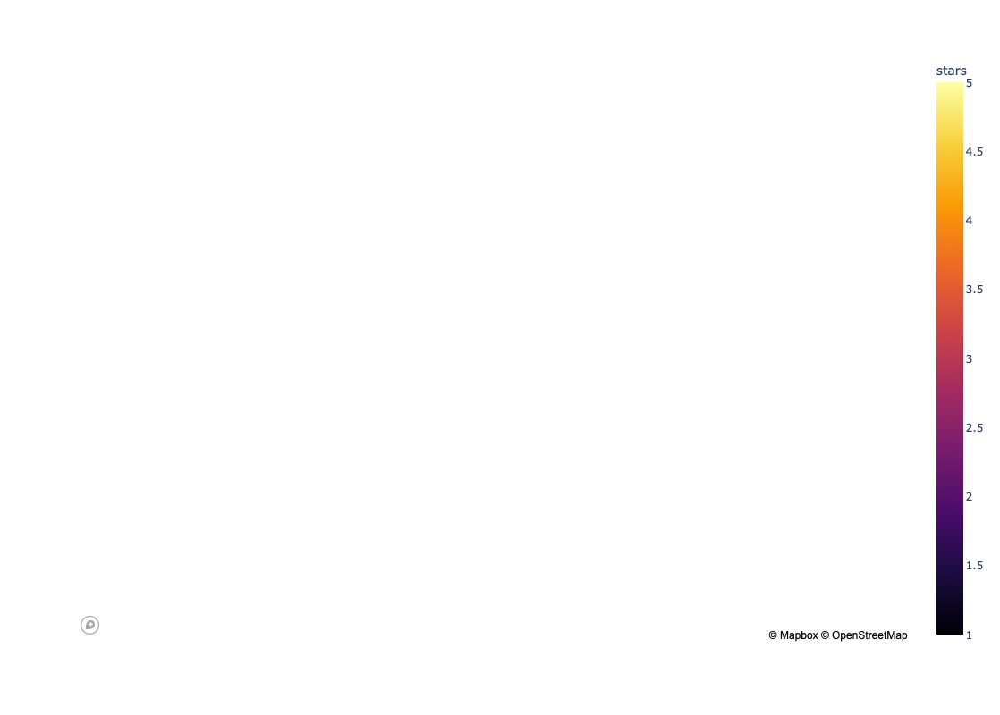

In [13]:
# Mapping Philadelphia City Restaurants

px.set_mapbox_access_token('pk.eyJ1IjoiZGhlZXJhanJrIiwiYSI6ImNsbXpmdm50aDFpNzMya3QzeHA3aDM0bGgifQ.PF4WltCX22acurDgpUCb2A')
fig = px.scatter_mapbox(restaurants_df, lat="latitude", lon="longitude", color="stars", size="review_count", 
                        size_max=15, zoom=10, width=1000, height=800, color_continuous_scale="Inferno")
fig.show()


# K-Means Clustering

From the visualization, it's evident that in Philadelphia, certain regions are densely populated with restaurants, while others have fewer dining options. Consequently, it's logical to suggest eateries near a user's current location, irrespective of their position in the city.

Therefore, an effective method to categorize restaurants by their physical location is to employ the **K-Means Clustering Algorithm**. This algorithm identifies the cluster a user is in and selects the top 10 restaurants from that cluster for recommendations.

In [14]:
# Compiling Restaurant Location Coordinates into a DataFrame

# Extracting longitude and latitude data
restaurant_coordinates = restaurants_df[['longitude', 'latitude']]
restaurant_coordinates

,longitude,latitude
0,-75.155564,39.955505
1,-75.143226,39.953949
2,-75.162568,39.943223
3,-75.135657,39.962582
4,-75.194894,39.954573
...,...,...
3520,-75.174728,39.925205
3521,-75.157752,39.970720
3522,-75.189916,39.957447
3523,-75.214430,40.032483


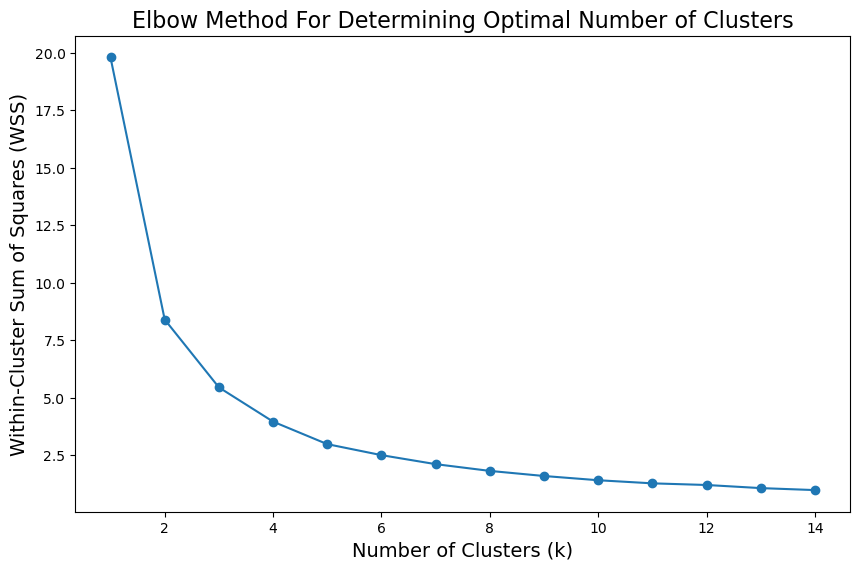

In [15]:
# Optimized Elbow Method for Determining Optimal K in KMeans Clustering

# Calculating distortions for various k values in a more efficient way
K = range(1, 15)
distortions = [KMeans(n_clusters=k).fit(restaurant_coordinates).inertia_ for k in K]

# Efficiently plotting the Elbow Graph for WSS
plt.figure(figsize=(10, 10/1.6180))
plt.plot(K, distortions, marker='o')
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Within-Cluster Sum of Squares (WSS)', fontsize=14)
plt.title('Elbow Method For Determining Optimal Number of Clusters', fontsize=16)
plt.show()


In the Elbow Method, we compute the Within-Cluster Sum of Squares (WSS) for various k values and select the k at which WSS begins to decrease at a slower rate. This point is identifiable as an 'elbow' in the WSS-versus-k graph. According to the depicted graph, the optimal number of clusters (k) appears to be 2.

**k = 2 (clusters)**

In [16]:
# Optimized Silhouette Score Method for Determining Optimal K in KMeans Clustering

silhouette_scores = []
max_clusters = 25

for k in range(2, max_clusters + 1):
    kmeans_model = KMeans(n_clusters=k).fit(restaurant_coordinates)
    score = silhouette_score(restaurant_coordinates, kmeans_model.labels_, metric='euclidean')
    silhouette_scores.append(score)

# List of Silhouette Scores for different numbers of clusters
silhouette_scores


[0.6019561824777955,
 0.5524482924629032,
 0.5008537800045572,
 0.4973268973641199,
 0.47062882005552126,
 0.4805292069835363,
 0.4689150289355544,
 0.41522276606104624,
 0.4238341109893455,
 0.4383590480484947,
 0.4320027742390405,
 0.43803996979997734,
 0.4404720987108966,
 0.4184346843995901,
 0.4096335918509799,
 0.43599184147906633,
 0.4219654139404604,
 0.43062784724768743,
 0.43342441410251276,
 0.44133034997359327,
 0.4190254060976016,
 0.43903041234739804,
 0.419532134218439,
 0.4351229612687216]

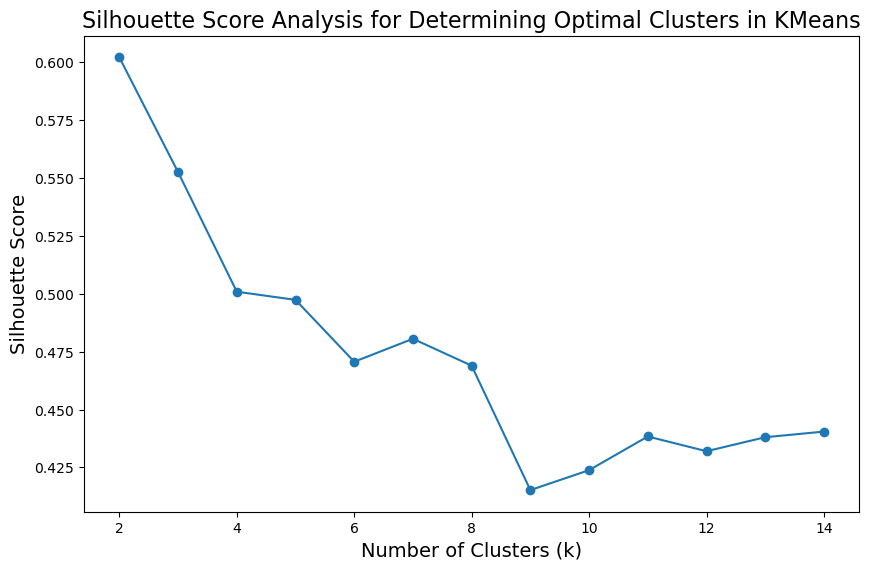

In [17]:
# Plotting the Elbow Graph for Silhouette Scores

plt.figure(figsize=(10, 10/1.6180))
plt.plot(range(2, 15), silhouette_scores[:13], marker='o')
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Silhouette Score', fontsize=14)
plt.title('Silhouette Score Analysis for Determining Optimal Clusters in KMeans', fontsize=16)
plt.show()


The Silhouette Score evaluates the similarity of a point to its cluster (cohesion) versus other clusters (separation), with values ranging from -1 to +1. A high score is preferable, suggesting correct cluster placement. The optimal number of clusters, or k, is identified where the Silhouette Score is maximized. Based on the provided scores, starting with a minimum of 2 clusters, the optimal k appears to be 2.

**k = 2 (clusters)**

In [18]:
# Configuring KMeans Clustering with K = 2

# Initializing and fitting the KMeans model
kmeans_model = KMeans(n_clusters=2, init='k-means++')
kmeans_model.fit(restaurant_coordinates)

# Generating cluster labels
cluster_labels = kmeans_model.labels_

# Calculating and displaying the silhouette score for k = 2
print(f"k = 2, Silhouette Score: {silhouette_score(restaurant_coordinates, cluster_labels, metric='euclidean')}")


k = 2, Silhouette Score: 0.6019561824777955


In [19]:
# Assigning Initial Clusters to Restaurant Data
restaurants_df['initial_cluster'] = kmeans_model.predict(restaurants_df[['longitude', 'latitude']])
restaurants_df.sample(5)


,business_id,name,categories,stars,review_count,latitude,longitude,postal_code,initial_cluster
3384,bh85W8Dwc0UUp75H-EYnkQ,Rising Sun Pizza,"Restaurants, Chicken Wings, Cheesesteaks, Pizza",2.5,43,40.056650,-75.088426,19111,0
1246,wbDRmtxaKRpBOjutvV6TEA,Barclay Prime,"Steakhouses, Restaurants",4.5,789,39.948710,-75.170874,19103,1
374,3lBooCffgkW7tVSG5kILBA,Porcini,"Restaurants, Italian",3.5,317,39.951348,-75.175114,19103,1
2163,Ke7FEXPJc6q54_DvVg995g,Hok Heng,"Pizza, Chicken Wings, Restaurants, Chinese",4.5,6,39.979170,-75.163369,19121,1
1020,5vAtunQlPFkfdTI9zn4TIw,Pitruco Pizza,"Street Vendors, Food, Restaurants, Pizza, Food...",4.5,142,39.958359,-75.195393,19104,1


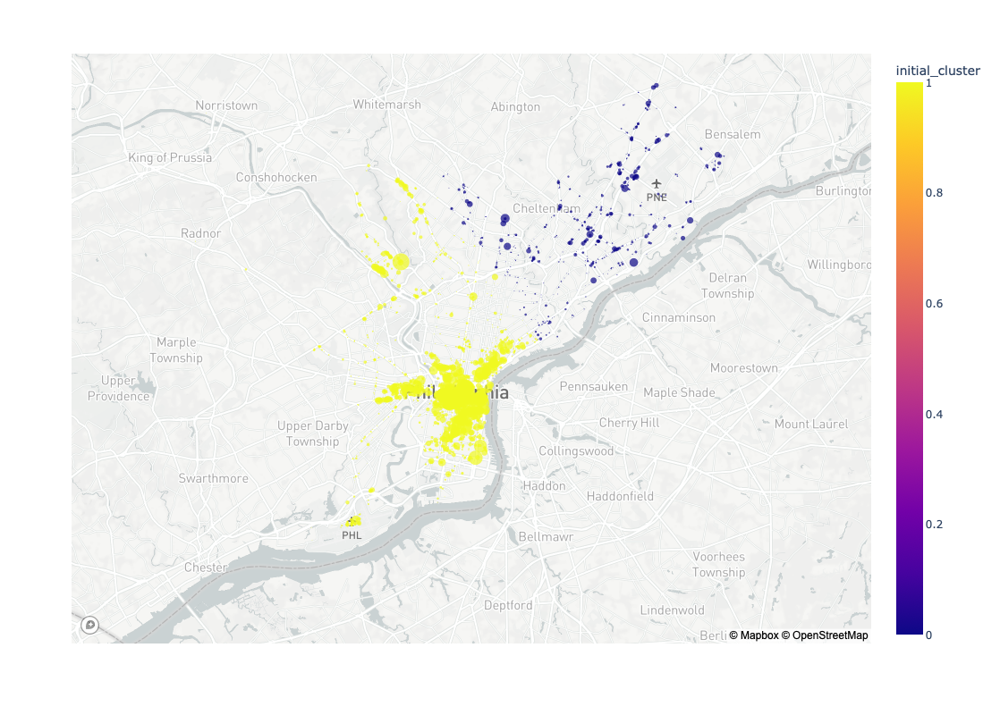

In [20]:
# Geographical Plot of 2 Clusters

fig = px.scatter_mapbox(restaurants_df, lat="latitude", lon="longitude", color="initial_cluster", size="review_count", 
                        hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1000, height=800)
fig.show()

The plot indicates that while there are two clusters, restaurants in less dense areas are widely dispersed. This could deter users from visiting recommended restaurants if they are too distant. It would be more effective to create a greater number of smaller, more evenly distributed clusters throughout the city.

In [21]:
# Experimenting with K = 15 for KMeans Clustering

# Setting up and fitting the KMeans model with 10 clusters
kmeans_model = KMeans(n_clusters=15, init='k-means++')
kmeans_model.fit(restaurant_coordinates)

# Obtaining cluster labels
cluster_labels = kmeans_model.labels_

# Calculating and displaying the silhouette score for k = 15
print(f"k = 15, Silhouette Score: {silhouette_score(restaurant_coordinates, cluster_labels, metric='euclidean')}")


k = 15, Silhouette Score: 0.42390078014973964


In [22]:
# Assigning Cluster Labels to Restaurants

restaurants_df['cluster'] = kmeans_model.predict(restaurants_df[['longitude', 'latitude']])
restaurants_df.head()


,business_id,name,categories,stars,review_count,latitude,longitude,postal_code,initial_cluster,cluster
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,80,39.955505,-75.155564,19107,1,14
1,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,"Sushi Bars, Restaurants, Japanese",4.0,245,39.953949,-75.143226,19106,1,14
2,ROeacJQwBeh05Rqg7F6TCg,BAP,"Korean, Restaurants",4.5,205,39.943223,-75.162568,19147,1,14
3,aPNXGTDkf-4bjhyMBQxqpQ,Craft Hall,"Eatertainment, Arts & Entertainment, Brewpubs,...",3.5,65,39.962582,-75.135657,19123,1,10
4,ppFCk9aQkM338Rgwpl2F5A,Wawa,"Restaurants, Automotive, Delis, Gas Stations, ...",3.0,56,39.954573,-75.194894,19104,1,6


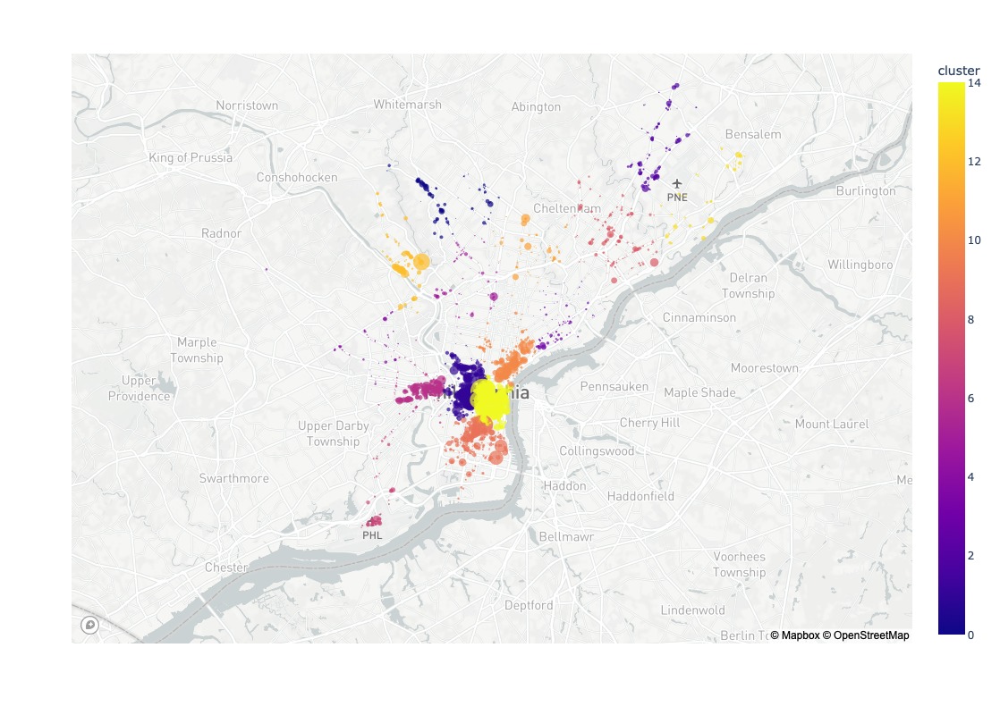

In [23]:
# Geographical Plot of 15 Clusters

fig = px.scatter_mapbox(restaurants_df, lat="latitude", lon="longitude", color="cluster", size="review_count", 
                        hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1000, height=800)
fig.show()

Increasing the number of clusters in our Location-Based Recommendation System will enable us to suggest restaurants nearer to a user's current location.

Besides proximity, it's crucial to recommend restaurants with high ratings. Generally, a higher star rating indicates a superior dining experience, which can enhance the user's satisfaction with our recommendation system.

In [24]:
# Ranking Restaurants by Ratings and Review Counts

# Sorting the restaurants by star ratings, then by number of reviews
best_rated_restaurants = restaurants_df.sort_values(by=['stars', 'review_count'], ascending=False)

# Displaying the top entries in the sorted list
best_rated_restaurants.head()


,business_id,name,categories,stars,review_count,latitude,longitude,postal_code,initial_cluster,cluster
1645,TE2IEDNV0RcI6s1wTOP4fg,Tortilleria San Roman,"Convenience Stores, Italian, Specialty Food, M...",5.0,219,39.937636,-75.158082,19147,1,14
2791,Ktg3ahIxk0JIkJwXAqu2ew,Hikari Sushi,"Restaurants, Sushi Bars, Japanese",5.0,155,39.967402,-75.141153,19123,1,10
3312,kT8IlV47kz1rz2lTuNyO1w,Christie's Deli,"Restaurants, Breakfast & Brunch, Delis, Sandwi...",5.0,152,39.963081,-75.169360,19130,1,1
2019,UMHuKs1sO-wq3XqKaejXeA,Miss Rachel's Pantry,"Arts & Crafts, Food, Shopping, Food Delivery S...",5.0,119,39.926515,-75.173776,19145,1,9
1878,gvD09Ev1aOmphtlq07zYEA,El Rancho Viejo,"Restaurants, Mexican",5.0,110,39.936282,-75.152142,19147,1,14


In [25]:
# Defining a Function for Making Location-Based Restaurant Recommendations

def recommend_restaurants_nearby(dataframe, current_latitude, current_longitude):
    """
    Function to recommend restaurants based on the user's current location.
    """
    # Predicting the cluster for the given location
    predicted_cluster = kmeans_model.predict(np.array([current_longitude, current_latitude]).reshape(1, -1))[0]
    print(f"Assigned cluster for this location: {predicted_cluster}")
    
    # Selecting the top 10 restaurants in the predicted cluster
    return dataframe[dataframe['cluster'] == predicted_cluster].head(10)[['name', 'latitude', 'longitude', 'categories', 'stars', 'review_count', 'cluster']]


In [26]:
test_coordinates = {
    'id': [1, 2, 3],
    'name': ['Liberty Bell Center',
             'Philadelphia Museum of Art',
             'University of Pennsylvania'],
    'latitude': [39.9496, 39.9656, 39.9532],
    'longitude': [-75.1503, -75.1810, -75.1939]
}

test_coordinates = pd.DataFrame(test_coordinates)
test_coordinates

,id,name,latitude,longitude
0,1,Liberty Bell Center,39.9496,-75.1503
1,2,Philadelphia Museum of Art,39.9656,-75.1810
2,3,University of Pennsylvania,39.9532,-75.1939


In [27]:
loc1 = test_coordinates[test_coordinates['id'] == 1]
print(loc1['name'])
recommend_restaurants_nearby(best_rated_restaurants, loc1.latitude, loc1.longitude)


0    Liberty Bell Center
Name: name, dtype: object
Assigned cluster for this location: 14


,name,latitude,longitude,categories,stars,review_count,cluster
1645,Tortilleria San Roman,39.937636,-75.158082,"Convenience Stores, Italian, Specialty Food, M...",5.0,219,14
1878,El Rancho Viejo,39.936282,-75.152142,"Restaurants, Mexican",5.0,110,14
782,Alma Del Mar,39.937310,-75.158010,"Coffee & Tea, Seafood, Restaurants, Fish & Chi...",5.0,80,14
3505,Restaurant Ambra,39.940324,-75.149300,"Italian, Restaurants",5.0,61,14
2938,Palm Tree Gourmet,39.935885,-75.146716,"Restaurants, Vegetarian, Grocery, Specialty Fo...",5.0,44,14
3215,la bamba,39.938675,-75.153181,"Tacos, Restaurants, Mexican",5.0,44,14
448,The Lucky Well - Spring Arts,39.961265,-75.154128,"Chicken Shop, Barbeque, Restaurants",5.0,27,14
1141,Taco & Ramen,39.942243,-75.152919,"Mexican, Vegan, Restaurants, Juice Bars & Smoo...",5.0,26,14
345,Midori Sushi,39.942384,-75.150736,"Salad, Sushi Bars, Japanese, Restaurants",5.0,18,14
162,Yellow Bicycle Canteen,39.947224,-75.157252,"Caterers, Event Planning & Services, Cafes, Ve...",5.0,13,14


Assigned cluster for this location: 14


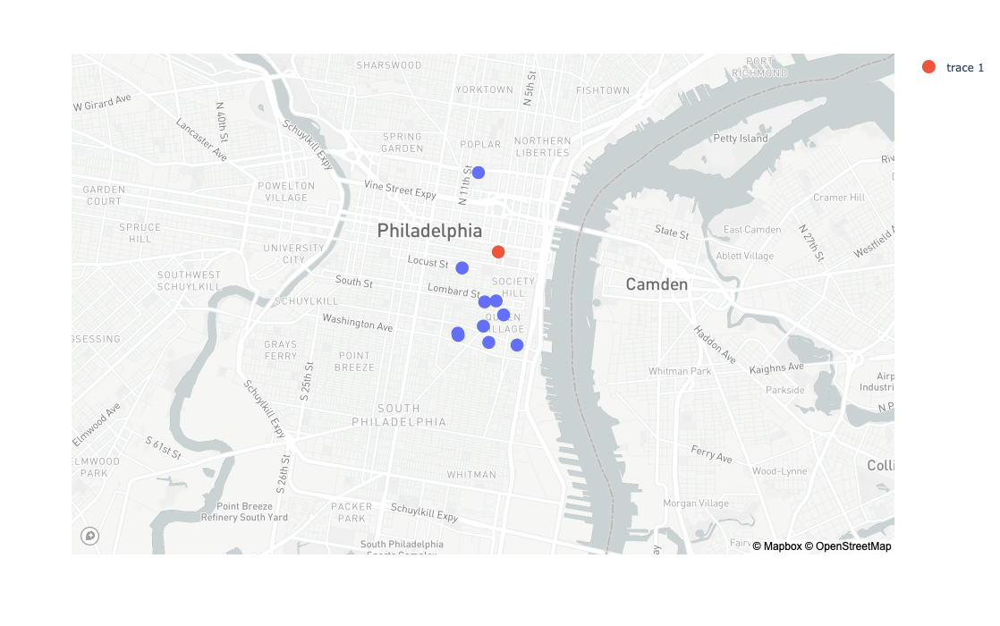

In [28]:
# Geographical Plot of Nearby Recommended Restaurants from Liberty Bell Center

fig = px.scatter_mapbox(recommend_restaurants_nearby(best_rated_restaurants, loc1.latitude, loc1.longitude), lat="latitude", lon="longitude",  
                   zoom=12, width=1000, height=700, hover_data= ['name', 'latitude', 'longitude', 'categories', 'stars', 'review_count'])
fig.add_scattermapbox(lat=loc1["latitude"], lon= loc1["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))


In [29]:
loc2 = test_coordinates[test_coordinates['id'] == 2]
print(loc2['name'])
recommend_restaurants_nearby(best_rated_restaurants, loc2.latitude, loc2.longitude)


1    Philadelphia Museum of Art
Name: name, dtype: object
Assigned cluster for this location: 1


,name,latitude,longitude,categories,stars,review_count,cluster
3312,Christie's Deli,39.963081,-75.169360,"Restaurants, Breakfast & Brunch, Delis, Sandwi...",5.0,152,1
2959,Bad Brother,39.968629,-75.176888,"Beer Bar, Nightlife, Restaurants, American (Tr...",5.0,92,1
139,Mom Mom's Kitchen and Polish Food Cart,39.943986,-75.167449,"Food, Polish, Food Trucks, Street Vendors, Res...",5.0,91,1
1901,A La Mousse,39.943993,-75.169575,"Coffee & Tea, Desserts, Food, Restaurants, Cafes",5.0,59,1
1787,South Deli and Grocery,39.944531,-75.171588,"Delis, Spanish, Restaurants, Food",5.0,29,1
265,Bold Coffee Bar,39.969977,-75.163925,"Coffee & Tea, Food, Cafes, Restaurants",5.0,28,1
3281,Villekebabs and Platters,39.950574,-75.169746,"Restaurants, Mediterranean, Afghan, Halal",5.0,21,1
334,Pho Mi Rittenhouse,39.951771,-75.173725,"Restaurants, Vietnamese",5.0,20,1
2420,Fudena,39.939628,-75.186640,"African, Food, Food Delivery Services, Restaur...",5.0,15,1
996,Greens and Grains,39.950639,-75.169199,"Restaurants, Vegan",5.0,14,1


Assigned cluster for this location: 1


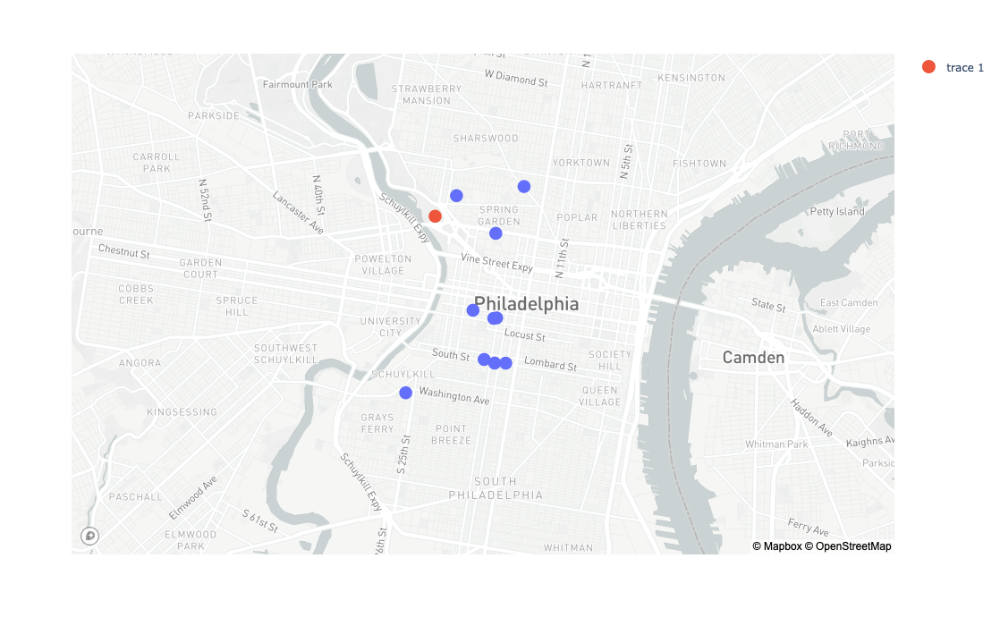

In [30]:
# Geographical Plot of Nearby Recommended Restaurants from Philadelphia Museum of Art

fig = px.scatter_mapbox(recommend_restaurants_nearby(best_rated_restaurants, loc2.latitude, loc2.longitude), lat="latitude", lon="longitude",  
                   zoom=12, width=1000, height=700, hover_data= ['name', 'latitude', 'longitude', 'categories', 'stars', 'review_count'])
fig.add_scattermapbox(lat=loc2["latitude"], lon= loc2["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

In [31]:
loc3 = test_coordinates[test_coordinates['id'] == 3]
print(loc3['name'])
recommend_restaurants_nearby(best_rated_restaurants, loc3.latitude, loc3.longitude)


2    University of Pennsylvania
Name: name, dtype: object
Assigned cluster for this location: 6


,name,latitude,longitude,categories,stars,review_count,cluster
2886,Fresh Donuts,39.962212,-75.201024,"Donuts, Breakfast & Brunch, Restaurants, Coffe...",5.0,22,6
3379,Alif Brew & Mini Mart,39.949178,-75.213168,"Restaurants, Food, Convenience Stores, Cafes, ...",5.0,19,6
1147,Linda's Cart,39.953042,-75.217928,"Food, Restaurants, Food Stands",5.0,16,6
570,52nd Station Diner,39.959681,-75.224842,"Comfort Food, Diners, Restaurants, Breakfast &...",5.0,15,6
246,Mommy Telly's Famous BBQ,39.956532,-75.189178,"Food, Food Trucks, Barbeque, Restaurants, Fili...",5.0,14,6
1388,The Gables Cafe,39.944194,-75.209709,"Food, Coffee & Tea, Restaurants, Italian, Dess...",5.0,14,6
2823,Rio Brazilan Steak Truck,39.955744,-75.190922,"Food, Event Planning & Services, Barbeque, Cat...",5.0,9,6
2272,Academic Bistro,39.957889,-75.188931,"Event Planning & Services, Restaurants, Educat...",5.0,6,6
3497,Greek From Greece,39.957993,-75.188979,"Greek, Cafes, Food, Mediterranean, Bakeries, C...",5.0,6,6
2506,Saad's Halal Restaurant,39.954963,-75.211851,"Halal, Middle Eastern, Restaurants, Food, Indi...",4.5,702,6


Assigned cluster for this location: 6


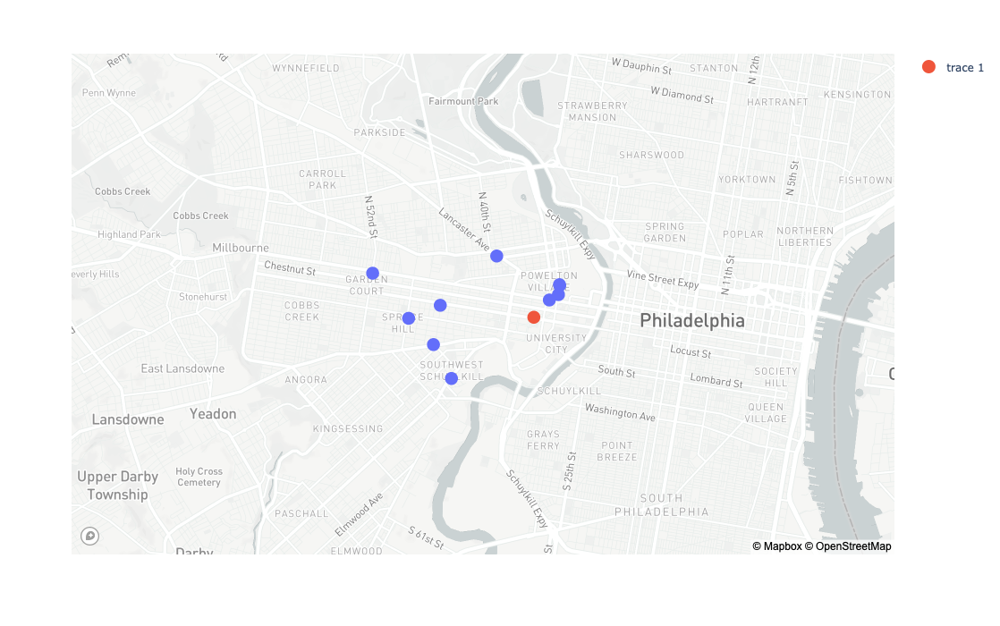

In [32]:
# Geographical Plot of Nearby Recommended Restaurants from University of Pennsylvania

fig = px.scatter_mapbox(recommend_restaurants_nearby(best_rated_restaurants, loc3.latitude, loc3.longitude), lat="latitude", lon="longitude",  
                   zoom=12, width=1000, height=700, hover_data= ['name', 'latitude', 'longitude', 'categories', 'stars', 'review_count'])
fig.add_scattermapbox(lat=loc3["latitude"], lon= loc3["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

# Collaborative-Filtering Recommendation System

Collaborative filtering is a method used to predict items a user may prefer, based on the preferences of other users with similar tastes. 

This technique involves identifying a broader user base and then narrowing down to a subset of users whose preferences align closely with those of a given user. By analyzing the items favored by these similar users, collaborative filtering generates a curated list of recommended items, ranked according to their potential relevance or appeal.



### Creating User-Item Matrix

In [33]:
final_reviews.head(3)

,review_id,user_id,business_id,stars,text,date,year,month,time,word_count,char_count,avg_word_len,stopword_count,cleaned_text,polarity,subjectivity,neg,neu,pos,compound,Dominant_Topic,Keywords,Text_Chunks,prime_score
0,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5.0,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03,2015,1,00:01:03,48,243,4.900000,12,wow yummy different delicious favorite lamb cu...,0.315152,0.733838,0.000,0.660,0.340,0.9588,0.0,"food, place, great, service, love, really, def...","['different', 'favorite', 'different', 'kind',...",5.302167
1,T_kAb2NeylB-JdNDKphryw,Z-xgVb4nM42943m2wbBkFw,kxX2SOes4o-D3ZQBkiMRfA,5.0,We've eaten here 3 times and it seems that eac...,2017-01-02 14:25:26,2017,1,14:25:26,66,341,4.246154,26,weve eaten 3 time seems time get better shrimp...,0.265476,0.591667,0.022,0.772,0.206,0.9339,0.0,"food, place, great, service, love, really, def...","['eat', 'time', 'time', 'well', 'shrimp', 'mal...",5.247928
2,NENaCqb6TNj5CyY1LOdI6Q,2SEoXb6r6hPKrl9V9VzBgA,kxX2SOes4o-D3ZQBkiMRfA,5.0,Came to Philly for a family event but stayed a...,2015-07-28 17:15:20,2015,7,17:15:20,28,149,4.357143,13,came philly family event stayed little dinner ...,0.178125,0.862500,0.000,0.730,0.270,0.8918,0.0,"food, place, great, service, love, really, def...","['philly', 'family', 'event', 'stay', 'little'...",5.158852


In [34]:
restaurants_df.head(3)

,business_id,name,categories,stars,review_count,latitude,longitude,postal_code,initial_cluster,cluster
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",4.0,80,39.955505,-75.155564,19107,1,14
1,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,"Sushi Bars, Restaurants, Japanese",4.0,245,39.953949,-75.143226,19106,1,14
2,ROeacJQwBeh05Rqg7F6TCg,BAP,"Korean, Restaurants",4.5,205,39.943223,-75.162568,19147,1,14


In [35]:
# Creating a DataFrame with Selected Columns

refined_reviews = final_reviews[['business_id', 'user_id', 'prime_score', 'Keywords']]
refined_reviews.head(3)


,business_id,user_id,prime_score,Keywords
0,kxX2SOes4o-D3ZQBkiMRfA,_7bHUi9Uuf5__HHc_Q8guQ,5.302167,"food, place, great, service, love, really, def..."
1,kxX2SOes4o-D3ZQBkiMRfA,Z-xgVb4nM42943m2wbBkFw,5.247928,"food, place, great, service, love, really, def..."
2,kxX2SOes4o-D3ZQBkiMRfA,2SEoXb6r6hPKrl9V9VzBgA,5.158852,"food, place, great, service, love, really, def..."


In [36]:
philly_restaurants = restaurants_df[['business_id', 'name', 'categories']]
philly_restaurants.head()

,business_id,name,categories
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,"Restaurants, Food, Bubble Tea, Coffee & Tea, B..."
1,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,"Sushi Bars, Restaurants, Japanese"
2,ROeacJQwBeh05Rqg7F6TCg,BAP,"Korean, Restaurants"
3,aPNXGTDkf-4bjhyMBQxqpQ,Craft Hall,"Eatertainment, Arts & Entertainment, Brewpubs,..."
4,ppFCk9aQkM338Rgwpl2F5A,Wawa,"Restaurants, Automotive, Delis, Gas Stations, ..."


In [37]:
# Joining DataFrames Together

philly_data = pd.merge(refined_reviews, philly_restaurants, on='business_id')
philly_data.head()


,business_id,user_id,prime_score,Keywords,name,categories
0,kxX2SOes4o-D3ZQBkiMRfA,_7bHUi9Uuf5__HHc_Q8guQ,5.302167,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian"
1,kxX2SOes4o-D3ZQBkiMRfA,Z-xgVb4nM42943m2wbBkFw,5.247928,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian"
2,kxX2SOes4o-D3ZQBkiMRfA,2SEoXb6r6hPKrl9V9VzBgA,5.158852,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian"
3,kxX2SOes4o-D3ZQBkiMRfA,toFm0jWZJKqsOmHE7kMbRA,5.046233,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian"
4,kxX2SOes4o-D3ZQBkiMRfA,cMvau1VAjuKo_ah0ZBck1g,4.253006,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian"


In [38]:
# Merging Keywords and Categories into a Single Column

# Concatenating the 'categories' and 'Keywords' columns with a separator
philly_data['Combined_Keywords'] = philly_data['categories'].str.cat(philly_data['Keywords'], sep=", ")

# Displaying the first few rows of the updated DataFrame
philly_data.sample(5)


,business_id,user_id,prime_score,Keywords,name,categories,Combined_Keywords
254377,jxEMFqwDJXjCxmcm5t5jVQ,veZ2f5-qUZMNR-jeWYtJlA,5.325509,"pizza, sandwich, cheese, fry, steak, chicken, ...",Cleavers,"Food, Restaurants, Cocktail Bars, Cheesesteaks...","Food, Restaurants, Cocktail Bars, Cheesesteaks..."
343558,bzOCjuydWTkgkbZeaec8Zg,3hDaOdQxKcIVcyZs5rDKZw,1.252312,"order, time, food, wait, give, ask, table, nev...",La Colombe,"Food, Coffee & Tea, Juice Bars & Smoothies, Ba...","Food, Coffee & Tea, Juice Bars & Smoothies, Ba..."
99900,ajGUFDANNSnqUoLvZPCcPw,vodJ6XmQub3PNQKXzzRZqQ,5.066887,"order, time, food, wait, give, ask, table, nev...",Mace's Crossing,"American (Traditional), Restaurants, Bars, Nig...","American (Traditional), Restaurants, Bars, Nig..."
206402,7pAgxBMUjrVPH7xh3fn-gw,XaAt1OTPgHvYGqqJYJpIKA,5.365104,"food, place, great, service, love, really, def...",Oh Brother Philly,"Food, Restaurants, Cheesesteaks, Sandwiches, D...","Food, Restaurants, Cheesesteaks, Sandwiches, D..."
230888,Uky0DD3LU4C7eyNDhpmOXg,Il8Z6owdbOoZT_lm4NjnCw,5.357765,"food, place, great, service, love, really, def...",Day By Day,"Restaurants, Event Planning & Services, Food D...","Restaurants, Event Planning & Services, Food D..."


In [39]:
# Identifying Highest-Rated Restaurants in Philadelphia

# Calculating the average 'prime_score' for each restaurant and sorting them in descending order
top_rated_philly_restaurants = philly_data.groupby('name')['prime_score'].mean().sort_values(ascending=False).head()

top_rated_philly_restaurants


name
Otolith Sustainable Seafood    5.738400
Philadelphia Art Alliance      5.610597
Dragon House                   5.508508
Leneghan's Crusader Inn        5.484582
Linda's Cart                   5.483058
Name: prime_score, dtype: float64

The Restaurant with the Highest Prime Score Rating in Philadelphia is `Otolith Sustainable Seafood`.

In [40]:
# Finding Philadelphia Restaurants with the Most Yelp Reviews

# Counting reviews for each restaurant and sorting them in descending order
most_reviewed_philly_restaurants = philly_data.groupby('name')['prime_score'].count().sort_values(ascending=False).head()

most_reviewed_philly_restaurants


name
Reading Terminal Market           3802
Dim Sum Garden                    2356
Green Eggs Café                   2291
Dalessandro’s Steaks & Hoagies    2209
Zahav                             2089
Name: prime_score, dtype: int64

The Restaurant with the Highest number of Yelp Reviews in Philadelphia is `Reading Terminal Market`.

In [41]:
# Generating a User-Restaurant Rating Matrix

# Constructing the pivot table with users as rows, restaurants as columns, and their ratings
user_restaurant_ratings = philly_data.pivot_table(index='user_id', columns='name', values='prime_score')

# Displaying the top entries of the matrix
user_restaurant_ratings.head()


name,$5 Fresh Burger Stop,&pizza - UPenn,&pizza - Walnut,1 Stop Pizza,1100 Social,1201 Bar,1225Raw Sushi and Sake Lounge,13 Restaurant,1518 Bar & Grill,16th Street Seafood,17 Snyder Chinese,19 Degrees,1st NE International Market,2 Street Sammies,2 in One Cafe,20th Street Pizza,2637brew,2nd Story Brewing,2nd Street Brew House,3 Brothers Pizza & Pasta,3J's Food Market,3J's Food Market Fishtown,4 Seasons Food Market,4 Seasons Grill Mexican Restaurant,48th Street Grille,...,Zahav,Zaika,Zama,Zesto Pizza & Grill,Zesty's,Zhong Gang Bakery,Zio Pizza Palace & Grill,Zio's Brick Oven Pizzeria,Zorba's Taverna,Zushi,Zuzu's Kitchen,a.bar,a.kitchen,bāo•logy,chili's,honeygrow,iMunch Cafe,iPho,iPho Vietnamese Restaurant,la bamba,moonbowls,nunu,penrose cheesesteak,revive 21,sweetgreen
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
--2vR0DIsmQ6WfcSzKWigw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--4AjktZiHowEIBCMd4CZA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--4_p6Z3tKadJcr9Non_Vw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--6GckBYtTa4hj8pT09oAg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--6PFZka7og6Khaw6oyjvQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
# Function to Normalize Ratings by Centering Around the Mean

def normalize_ratings(dataframe):
    """ Adjusts ratings by subtracting the row mean from each value. """
    return (dataframe.T - dataframe.mean(axis=1)).T

# Applying normalization to the Toronto restaurant ratings
philly_ratings = normalize_ratings(user_restaurant_ratings)

# Displaying the first few rows of the normalized ratings
philly_ratings.head()


name,$5 Fresh Burger Stop,&pizza - UPenn,&pizza - Walnut,1 Stop Pizza,1100 Social,1201 Bar,1225Raw Sushi and Sake Lounge,13 Restaurant,1518 Bar & Grill,16th Street Seafood,17 Snyder Chinese,19 Degrees,1st NE International Market,2 Street Sammies,2 in One Cafe,20th Street Pizza,2637brew,2nd Story Brewing,2nd Street Brew House,3 Brothers Pizza & Pasta,3J's Food Market,3J's Food Market Fishtown,4 Seasons Food Market,4 Seasons Grill Mexican Restaurant,48th Street Grille,...,Zahav,Zaika,Zama,Zesto Pizza & Grill,Zesty's,Zhong Gang Bakery,Zio Pizza Palace & Grill,Zio's Brick Oven Pizzeria,Zorba's Taverna,Zushi,Zuzu's Kitchen,a.bar,a.kitchen,bāo•logy,chili's,honeygrow,iMunch Cafe,iPho,iPho Vietnamese Restaurant,la bamba,moonbowls,nunu,penrose cheesesteak,revive 21,sweetgreen
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
--2vR0DIsmQ6WfcSzKWigw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--4AjktZiHowEIBCMd4CZA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--4_p6Z3tKadJcr9Non_Vw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--6GckBYtTa4hj8pT09oAg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
--6PFZka7og6Khaw6oyjvQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
# Filling all Null Values with 0.0

philly_ratings = philly_ratings.fillna(0)
philly_ratings.head()


name,$5 Fresh Burger Stop,&pizza - UPenn,&pizza - Walnut,1 Stop Pizza,1100 Social,1201 Bar,1225Raw Sushi and Sake Lounge,13 Restaurant,1518 Bar & Grill,16th Street Seafood,17 Snyder Chinese,19 Degrees,1st NE International Market,2 Street Sammies,2 in One Cafe,20th Street Pizza,2637brew,2nd Story Brewing,2nd Street Brew House,3 Brothers Pizza & Pasta,3J's Food Market,3J's Food Market Fishtown,4 Seasons Food Market,4 Seasons Grill Mexican Restaurant,48th Street Grille,...,Zahav,Zaika,Zama,Zesto Pizza & Grill,Zesty's,Zhong Gang Bakery,Zio Pizza Palace & Grill,Zio's Brick Oven Pizzeria,Zorba's Taverna,Zushi,Zuzu's Kitchen,a.bar,a.kitchen,bāo•logy,chili's,honeygrow,iMunch Cafe,iPho,iPho Vietnamese Restaurant,la bamba,moonbowls,nunu,penrose cheesesteak,revive 21,sweetgreen
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
--2vR0DIsmQ6WfcSzKWigw,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--4AjktZiHowEIBCMd4CZA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--4_p6Z3tKadJcr9Non_Vw,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--6GckBYtTa4hj8pT09oAg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--6PFZka7og6Khaw6oyjvQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
# Check Mean scores across user_ids

philly_ratings.mean(axis=1)

user_id
--2vR0DIsmQ6WfcSzKWigw    0.000000e+00
--4AjktZiHowEIBCMd4CZA   -1.467578e-18
--4_p6Z3tKadJcr9Non_Vw    0.000000e+00
--6GckBYtTa4hj8pT09oAg    0.000000e+00
--6PFZka7og6Khaw6oyjvQ    1.467578e-19
                              ...     
zzffZHugqHgdg-BcLgpY7Q    0.000000e+00
zzvCl_egPyWpxO7EvWc2IA    0.000000e+00
zzwYLnmIvj8C7wJmRjtkRA   -2.935157e-19
zzx7J3zheFF3zf5YYfDAMg    0.000000e+00
zzzMBVS73g3ZJ7qL8JyhiA    0.000000e+00
Length: 137982, dtype: float64

In [45]:
philly_ratings.mean(axis=1).isnull().sum()

0

In [46]:
# Check Mean scores across business_ids

philly_ratings.mean(axis = 0)

name
$5 Fresh Burger Stop    0.000016
&pizza - UPenn          0.000039
&pizza - Walnut         0.000491
1 Stop Pizza            0.000020
1100 Social            -0.000118
                          ...   
moonbowls               0.000003
nunu                   -0.000088
penrose cheesesteak     0.000023
revive 21              -0.000010
sweetgreen              0.000033
Length: 3026, dtype: float64

In [47]:
philly_ratings.mean(axis = 0).isnull().sum()

0

## Cosine Similarity

Cosine similarity is used to gauge a user's preference by assessing the similarity between the user profile and all item profiles. This metric calculates the cosine of the angle between two vectors, essentially the ratio of the dot product of the vectors to the product of their magnitudes. Since the calculation normalizes the data, it primarily measures the difference in direction rather than magnitude. In this context, the cosine similarity of each restaurant relative to each user is determined. With the cosine of a 0-degree angle being 1, values closer to 1 indicate a higher degree of similarity between the items.

In [48]:
# Overview of Matrix - #137,982 rows of User_ids, 3,026 columns of Restaurants

print(philly_ratings.shape)
philly_ratings

(137982, 3026)


name,$5 Fresh Burger Stop,&pizza - UPenn,&pizza - Walnut,1 Stop Pizza,1100 Social,1201 Bar,1225Raw Sushi and Sake Lounge,13 Restaurant,1518 Bar & Grill,16th Street Seafood,17 Snyder Chinese,19 Degrees,1st NE International Market,2 Street Sammies,2 in One Cafe,20th Street Pizza,2637brew,2nd Story Brewing,2nd Street Brew House,3 Brothers Pizza & Pasta,3J's Food Market,3J's Food Market Fishtown,4 Seasons Food Market,4 Seasons Grill Mexican Restaurant,48th Street Grille,...,Zahav,Zaika,Zama,Zesto Pizza & Grill,Zesty's,Zhong Gang Bakery,Zio Pizza Palace & Grill,Zio's Brick Oven Pizzeria,Zorba's Taverna,Zushi,Zuzu's Kitchen,a.bar,a.kitchen,bāo•logy,chili's,honeygrow,iMunch Cafe,iPho,iPho Vietnamese Restaurant,la bamba,moonbowls,nunu,penrose cheesesteak,revive 21,sweetgreen
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
--2vR0DIsmQ6WfcSzKWigw,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--4AjktZiHowEIBCMd4CZA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--4_p6Z3tKadJcr9Non_Vw,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--6GckBYtTa4hj8pT09oAg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
--6PFZka7og6Khaw6oyjvQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zzffZHugqHgdg-BcLgpY7Q,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zzvCl_egPyWpxO7EvWc2IA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zzwYLnmIvj8C7wJmRjtkRA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
# List of first 10 Yelp Customer User_ids in the Matrix

user_ids = list(philly_ratings.index)
user_ids[:10]

['--2vR0DIsmQ6WfcSzKWigw',
 '--4AjktZiHowEIBCMd4CZA',
 '--4_p6Z3tKadJcr9Non_Vw',
 '--6GckBYtTa4hj8pT09oAg',
 '--6PFZka7og6Khaw6oyjvQ',
 '--9SwR3jQX-e3opxARFF_g',
 '--B0My3yotQA2kLVWz6IYA',
 '--CiqXBj69Uu4YN1WTQ82Q',
 '--DBsOOiMurIanfF2GQLmQ',
 '--Dq76pp192-Wk-vo_dPmg']

In [50]:
# Converting the Matrix DataFrame into a NumPy array

matrix = philly_ratings.to_numpy()
matrix[:10]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

## Truncated SVD

Matrix factorization, particularly through truncated Singular Value Decomposition (SVD), is a well-regarded method for generating features by decomposing a matrix M into three matrices: U, Σ, and V. Truncated SVD is akin to Principal Component Analysis (PCA) in some aspects. While truncated SVD is derived directly from the data matrix, PCA's factorization originates from the covariance matrix.

Truncated SVD differs from regular SVD by allowing for a specified number of columns in the resulting factorization, thus offering a truncation feature. In contrast to regular SVD, which outputs matrices with n columns for an n x n matrix, truncated SVD can produce matrices with a predetermined number of columns. This characteristic makes truncated SVD especially useful for handling sparse matrices, as it can generate feature matrices efficiently, while PCA works on the complete matrix to produce a covariance matrix output.

In [51]:
# Applying Singular Value Decomposition (SVD)

#The number of factors to factor the user-item matrix.

NUMBER_OF_FACTORS_MF = 15

#Performs matrix factorization of the original user item matrix

U, sigma, Vt = svds(matrix, k = NUMBER_OF_FACTORS_MF)

print(U.shape)
print(Vt.shape)

sigma = np.diag(sigma)
sigma.shape

(137982, 15)
(15, 3026)


(15, 15)

Following the factorization process, the aim is to reconstruct the original matrix through the multiplication of its factors. The reconstructed matrix is no longer sparse. It creates predictions for items with which the user has not yet interacted, and these predictions are utilized for making recommendations.

In [52]:
# Calculating Predicted Ratings for All Users Across Philadelphia Restaurants

# Performing matrix multiplication to estimate user ratings
predicted_user_ratings = np.dot(np.dot(U, sigma), Vt)
predicted_user_ratings


array([[-3.44657017e-19,  1.04394763e-17,  2.51846900e-17, ...,
        -4.95189071e-19, -2.67570597e-20,  8.98705909e-18],
       [-6.69324255e-06, -5.92811993e-05,  3.28731677e-04, ...,
         5.25654066e-06, -2.72936997e-06, -3.50037327e-04],
       [ 4.64440976e-19,  2.05696100e-17, -3.27790349e-17, ...,
        -3.06081002e-19, -7.61992260e-20, -1.29452331e-17],
       ...,
       [-6.80870867e-06,  1.62548809e-04,  2.26201683e-03, ...,
        -2.20930749e-06,  3.76978680e-06,  3.03976077e-03],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [53]:
# Transforming the Reconstructed Matrix into a DataFrame

# Creating a DataFrame from the matrix of predicted ratings
predicted_ratings_df = pd.DataFrame(predicted_user_ratings, columns=philly_ratings.columns, index=user_ids).transpose()
print(predicted_ratings_df.shape)
predicted_ratings_df


(3026, 137982)


,--2vR0DIsmQ6WfcSzKWigw,--4AjktZiHowEIBCMd4CZA,--4_p6Z3tKadJcr9Non_Vw,--6GckBYtTa4hj8pT09oAg,--6PFZka7og6Khaw6oyjvQ,--9SwR3jQX-e3opxARFF_g,--B0My3yotQA2kLVWz6IYA,--CiqXBj69Uu4YN1WTQ82Q,--DBsOOiMurIanfF2GQLmQ,--Dq76pp192-Wk-vo_dPmg,--Dz7-yZ5vMuDdlHxfBWVw,--FcqRehCCnPWDzTpKyO0Q,--FxiKq-x-zu-tfn4F55DA,--Hno7jSp4AeOC1vq2Ohew,--NDEkbouP9gfIO7DOq2Bw,--Qos7f808A7REJPzSZ5Og,--QuTu4oQehIyk8VCaLVFQ,--S8M395r8NtOCvS2LRfDw,--UhENQdbuWEh0mU5weIEg,--UizzbnQlZg7bEv2oXEyg,--Whu2Ivi3IXXBo7aU1i3A,--YFsSwR8YRhFwwv9ZkKBw,--YWBD-491bjkqJWEUGaDg,--_r6E98SNIrGU7weyNxbw,--a-gJTBfWStlOFvVpcMMw,...,zzIhKazCpzGUrIrM7izSig,zzJ4bBh74PsfTxBnsdFvyQ,zzJPmRrEMNzCZJkXPRpGZw,zzJbi0DTEb9yOIfvyqXM4w,zzM4mUZCmwd6_aMI80qd7g,zzMd5A98PXaxUf8DOsgd4w,zzSSEPbr4hkvPBOq1ZM9Yw,zzSiUxBTpvLyOKWVohcD-w,zzVaDPjv1VD9djIYU6KjUw,zzW1NTuShpLFy-4zPFbggw,zzW56xgATvt0CouuDYxkrA,zz_IdT6jBEARhqMzmFkZqQ,zz_Jbm0xC3bA7Ymfif48Ow,zzchaUFyh1POp24Y5muYEQ,zzcoNVe5qCceXGkp1C-EZw,zzd6AtVdNdgRT7v63iu8Vg,zzdsnjlRXEu120ZRTLAwPA,zzeRWIiPtuJNRBUcxe0Upw,zzeYPGdmowtbqjZIbKZpqw,zzfdOXALn161r4ZlMWc_vw,zzffZHugqHgdg-BcLgpY7Q,zzvCl_egPyWpxO7EvWc2IA,zzwYLnmIvj8C7wJmRjtkRA,zzx7J3zheFF3zf5YYfDAMg,zzzMBVS73g3ZJ7qL8JyhiA
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
$5 Fresh Burger Stop,-3.446570e-19,-6.693243e-06,4.644410e-19,3.715392e-19,1.877992e-04,-1.412109e-18,6.685732e-20,1.313864e-19,-5.647327e-19,8.003345e-20,-1.613949e-19,-1.853169e-19,-1.145304e-19,5.855574e-19,0.0,0.0,-8.739061e-06,0.0,0.0,0.0,0.0,2.028383e-07,0.0,-2.983466e-06,0.0,...,0.000506,0.0,0.0,0.0,0.0,-2.115536e-06,0.0,0.0,0.0,-8.700604e-06,-3.035285e-06,-1.017248e-05,0.0,0.0,0.0,0.0,0.0,-3.159768e-05,0.0,0.0,0.0,0.000014,-6.808709e-06,0.0,0.0
&pizza - UPenn,1.043948e-17,-5.928120e-05,2.056961e-17,-9.521432e-19,1.507666e-03,-2.401816e-17,-2.040046e-18,-1.636353e-18,6.037869e-21,-5.937479e-18,-2.373093e-19,-9.141982e-19,3.914654e-19,1.370350e-18,0.0,0.0,-3.536183e-05,0.0,0.0,0.0,0.0,1.145081e-06,0.0,-2.346964e-05,0.0,...,0.000228,0.0,0.0,0.0,0.0,3.114708e-05,0.0,0.0,0.0,-6.453473e-05,9.411812e-05,-8.312020e-06,0.0,0.0,0.0,0.0,0.0,-2.685406e-04,0.0,0.0,0.0,-0.000072,1.625488e-04,0.0,0.0
&pizza - Walnut,2.518469e-17,3.287317e-04,-3.277903e-17,-1.577859e-18,-1.942345e-03,-1.597973e-16,-3.693025e-17,2.461554e-17,-2.148587e-17,4.308943e-17,7.328274e-18,-1.271897e-18,-5.000175e-17,1.670854e-17,0.0,0.0,-2.400763e-04,0.0,0.0,0.0,0.0,2.924640e-05,0.0,6.377606e-05,0.0,...,0.009608,0.0,0.0,0.0,0.0,-2.869149e-04,0.0,0.0,0.0,-4.026047e-05,-3.020220e-04,1.317516e-05,0.0,0.0,0.0,0.0,0.0,1.286935e-03,0.0,0.0,0.0,0.001242,2.262017e-03,0.0,0.0
1 Stop Pizza,-1.562610e-18,4.968289e-07,2.363437e-18,1.559075e-20,-9.086203e-06,2.461375e-18,9.407950e-19,-2.225052e-18,-1.978339e-20,-3.972883e-19,1.918908e-19,7.834087e-20,-1.058189e-18,2.186279e-19,0.0,0.0,1.399049e-05,0.0,0.0,0.0,0.0,-1.324254e-07,0.0,-1.834929e-08,0.0,...,0.000018,0.0,0.0,0.0,0.0,1.065299e-06,0.0,0.0,0.0,-2.093608e-06,6.074501e-07,-4.800632e-06,0.0,0.0,0.0,0.0,0.0,-8.328111e-06,0.0,0.0,0.0,-0.000001,-6.043297e-07,0.0,0.0
1100 Social,2.615461e-18,1.534373e-05,5.030549e-18,-5.671835e-19,3.310769e-04,4.913351e-18,-7.229714e-19,-3.796412e-18,9.122392e-20,2.683711e-18,3.468154e-18,-2.196044e-19,-1.194332e-18,-1.809558e-18,0.0,0.0,1.908158e-05,0.0,0.0,0.0,0.0,-9.986901e-08,0.0,6.113328e-06,0.0,...,-0.000210,0.0,0.0,0.0,0.0,-5.240648e-06,0.0,0.0,0.0,-9.376934e-06,1.489538e-05,-2.065576e-06,0.0,0.0,0.0,0.0,0.0,1.816577e-04,0.0,0.0,0.0,0.000010,-1.012437e-05,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
moonbowls,-1.290895e-18,-2.355466e-05,5.829299e-18,-2.003634e-18,6.447017e-04,3.633335e-18,7.745652e-19,8.573546e-19,5.565964e-19,-9.594227e-19,-8.440876e-19,1.591121e-20,-7.522844e-20,7.344472e-20,0.0,0.0,-2.681060e-08,0.0,0.0,0.0,0.0,-6.147765e-07,0.0,-6.641488e-06,0.0,...,-0.000643,0.0,0.0,0.0,0.0,7.058882e-06,0.0,0.0,0.0,-2.722

In [54]:
# Generating an Item-to-Item Similarity Matrix with Cosine Similarity

# Calculating cosine similarity for the DataFrame
item_similarity_matrix = cosine_similarity(predicted_ratings_df)

# Converting the similarity matrix into a DataFrame
item_similarity_matrix = pd.DataFrame(item_similarity_matrix, columns=predicted_ratings_df.index, index=predicted_ratings_df.index)
item_similarity_matrix


name,$5 Fresh Burger Stop,&pizza - UPenn,&pizza - Walnut,1 Stop Pizza,1100 Social,1201 Bar,1225Raw Sushi and Sake Lounge,13 Restaurant,1518 Bar & Grill,16th Street Seafood,17 Snyder Chinese,19 Degrees,1st NE International Market,2 Street Sammies,2 in One Cafe,20th Street Pizza,2637brew,2nd Story Brewing,2nd Street Brew House,3 Brothers Pizza & Pasta,3J's Food Market,3J's Food Market Fishtown,4 Seasons Food Market,4 Seasons Grill Mexican Restaurant,48th Street Grille,...,Zahav,Zaika,Zama,Zesto Pizza & Grill,Zesty's,Zhong Gang Bakery,Zio Pizza Palace & Grill,Zio's Brick Oven Pizzeria,Zorba's Taverna,Zushi,Zuzu's Kitchen,a.bar,a.kitchen,bāo•logy,chili's,honeygrow,iMunch Cafe,iPho,iPho Vietnamese Restaurant,la bamba,moonbowls,nunu,penrose cheesesteak,revive 21,sweetgreen
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
$5 Fresh Burger Stop,1.000000,0.249716,0.203300,-0.006794,0.065409,0.527629,-0.104469,-0.155850,-0.488514,-0.200965,-0.126865,-0.451942,-0.197185,-0.474221,-0.018621,0.142996,-0.694615,-0.658597,0.262273,0.531208,0.521813,0.234836,0.381132,-0.194386,0.360003,...,-0.026360,-0.233929,-0.498873,-0.379091,-0.588008,0.103727,0.341278,-0.225271,0.419075,0.604038,0.096607,0.235007,-0.477499,-0.313838,-0.302816,-0.347543,-0.099022,0.242610,-0.204891,-0.690079,0.232789,-0.446781,0.131181,-0.074885,-0.300951
&pizza - UPenn,0.249716,1.000000,-0.223984,0.011697,0.047448,0.101513,0.411799,-0.143576,-0.195780,-0.164685,-0.530089,0.227592,-0.362294,0.175143,-0.661068,-0.023367,-0.129171,0.146028,0.005125,-0.000174,-0.081716,0.127699,0.146485,-0.027973,-0.027166,...,-0.358402,-0.165509,0.042114,0.199586,0.184632,0.148732,-0.266505,0.251411,-0.257303,0.477429,-0.008032,0.264248,-0.026141,0.278780,-0.049113,0.238509,-0.275366,0.012789,0.457656,-0.391451,0.537097,0.184146,0.029754,-0.301169,0.058812
&pizza - Walnut,0.203300,-0.223984,1.000000,-0.201383,-0.037880,0.350676,-0.431543,-0.305642,-0.372689,0.045271,-0.324655,-0.777790,-0.245783,-0.543850,-0.140256,0.674974,-0.263583,-0.361006,-0.366681,0.193370,0.268092,-0.125747,0.023976,-0.179354,0.247984,...,0.425937,0.047267,-0.628049,-0.471612,0.017168,-0.103442,0.488712,0.471222,0.620907,-0.278474,-0.162640,0.609630,-0.043752,-0.740447,-0.197811,-0.449922,0.218349,0.459024,-0.359591,-0.162236,-0.120195,-0.426605,0.073237,-0.463507,-0.340609
1 Stop Pizza,-0.006794,0.011697,-0.201383,1.000000,0.049655,0.175742,0.002136,0.009313,-0.205281,0.019774,-0.059756,0.159905,-0.019123,0.013824,-0.090765,-0.030333,0.374796,0.121113,0.054929,0.031208,0.167935,0.711570,-0.262120,-0.679235,-0.521124,...,0.006007,-0.017821,-0.100430,0.066610,-0.147417,0.048749,0.021072,0.068004,0.002782,0.049472,-0.004726,-0.105129,-0.081720,-0.012953,-0.061336,-0.039272,-0.533583,-0.008341,-0.228505,0.029359,0.000467,-0.009460,0.409092,0.165151,0.086582
1100 Social,0.065409,0.047448,-0.037880,0.049655,1.000000,-0.223979,0.198862,-0.357321,0.102535,0.144498,0.214468,-0.058952,0.354466,0.219423,0.250335,0.337475,-0.256370,0.012405,-0.231820,-0.321907,0.175804,0.469917,0.105305,0.045940,-0.309425,...,0.068561,0.480816,-0.016172,0.425094,-0.322648,-0.048545,-0.012748,0.175143,0.199807,0.242186,-0.362367,0.071589,0.007358,0.278978,0.448347,0.107100,-0.043576,0.057667,0.045023,-0.087296,0.263776,-0.105069,0.310188,-0.182505,0.282872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
moonbowls,0.232789,0.537097,-0.120195,0.000467,0.263776,-0.308069,-0.015600,-0.041365,0.065044,-0.224039,0.096581,0.159165,0.336001,0.402565,0.012525,0.189857,0.034062,0.363315,-0.371827,0.173858,-0.193203,0.359289,-0.101556,0.004787,-0.420356,...,0.010189,0.000057,0.008204,0.025455,0.120304,0.268472,-0.295393,0.242946,-0.235676,0.470833,0.156165,0.005203,0.057510,0.278633,-0.063437,-0.048760,-0.296027,-0.055381,0.493890,-0.406754,1.000000,0.259593,0.007382,0.011991,0.206563
nunu,-0.

In [55]:
# Defining Function for Restaurant-to-Restaurant Collaborative Filtering Recommendations

def recommend_similar_restaurants(restaurant_name):
    """
    Identifies restaurants similar to a given restaurant.
    """
    # Correlation of the given restaurant with others
    target_restaurant_ratings = predicted_ratings_df.T[restaurant_name]
    correlated_restaurants = predicted_ratings_df.T.corrwith(target_restaurant_ratings)
    correlation_scores = pd.DataFrame(correlated_restaurants, columns=['Correlation'])
    correlation_scores.dropna(inplace=True)

    # Retrieving similarity scores from the item-item matrix
    restaurant_similarity_scores = item_similarity_matrix[restaurant_name]

    # Focusing on restaurants with positive correlation
    positive_correlations = restaurant_similarity_scores[restaurant_similarity_scores > 0]

    # Generating a list of Top 10 recommended restaurants, excluding the input restaurant
    top_recommendations = positive_correlations.sort_values(ascending=False).head(11).iloc[1:]

    return top_recommendations


Let's evaluate our Collaborative Filtering Model using two specific examples: `Reading Terminal Market`, renowned for having the most Yelp Reviews, and `Otolith Sustainable Seafood`, notable for its top-ranking Prime Score Rating.

Example 1: Reading Terminal Market

In [56]:
# Obtaining recommendations for those who enjoyed visiting Reading Terminal Market
suggested_restaurants = recommend_similar_restaurants('Reading Terminal Market')
suggested_restaurants = pd.DataFrame(data=suggested_restaurants)

suggested_restaurants


,Reading Terminal Market
name,
Gaetano’s,0.987967
Imperial Palace Chinese Restaurant,0.975909
Suzani Palace,0.969099
House of Kosher,0.931326
P & S Ravioli,0.925535
Top Taste 2,0.918305
Star Pizza,0.891949
Scramble Club,0.857237
AL-JANA Halal Food Market,0.837938


Example 2: Otolith Sustainable Seafood

In [57]:
# Obtaining recommendations for those who enjoyed visiting Otolith Sustainable Seafood
suggested_restaurants = recommend_similar_restaurants('Otolith Sustainable Seafood')
suggested_restaurants = pd.DataFrame(data=suggested_restaurants)

suggested_restaurants

,Otolith Sustainable Seafood
name,
Franzone's Pizzeria & Restaurant,0.923567
nunu,0.890500
Victory Beer Hall,0.889699
Hook & Master,0.879442
U-Bahn,0.878601
Corner Bakery,0.871747
Jose Pistola's,0.870960
Baby Blues BBQ Philly,0.870337
Ocean Harbor,0.868549


# Content-Based Recommendation System

Content-Based Recommendation suggests restaurants by matching similar categories and keywords.

In [58]:
philly_data.head(5)

,business_id,user_id,prime_score,Keywords,name,categories,Combined_Keywords
0,kxX2SOes4o-D3ZQBkiMRfA,_7bHUi9Uuf5__HHc_Q8guQ,5.302167,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","Halal, Pakistani, Restaurants, Indian, food, p..."
1,kxX2SOes4o-D3ZQBkiMRfA,Z-xgVb4nM42943m2wbBkFw,5.247928,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","Halal, Pakistani, Restaurants, Indian, food, p..."
2,kxX2SOes4o-D3ZQBkiMRfA,2SEoXb6r6hPKrl9V9VzBgA,5.158852,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","Halal, Pakistani, Restaurants, Indian, food, p..."
3,kxX2SOes4o-D3ZQBkiMRfA,toFm0jWZJKqsOmHE7kMbRA,5.046233,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","Halal, Pakistani, Restaurants, Indian, food, p..."
4,kxX2SOes4o-D3ZQBkiMRfA,cMvau1VAjuKo_ah0ZBck1g,4.253006,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","Halal, Pakistani, Restaurants, Indian, food, p..."


In [61]:
# Adjusting the Format of the 'Combined_Keywords' Column

# Converting all entries in 'Combined_Keywords' to strings and lowercasing them
philly_data['Combined_Keywords'] = philly_data['Combined_Keywords'].map(lambda x: str(x).lower())

# Displaying the dimensions of the DataFrame and its top entries
print(philly_data.shape)
philly_data.head()


(345261, 7)


,business_id,user_id,prime_score,Keywords,name,categories,Combined_Keywords
0,kxX2SOes4o-D3ZQBkiMRfA,_7bHUi9Uuf5__HHc_Q8guQ,5.302167,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","halal, pakistani, restaurants, indian, food, p..."
1,kxX2SOes4o-D3ZQBkiMRfA,Z-xgVb4nM42943m2wbBkFw,5.247928,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","halal, pakistani, restaurants, indian, food, p..."
2,kxX2SOes4o-D3ZQBkiMRfA,2SEoXb6r6hPKrl9V9VzBgA,5.158852,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","halal, pakistani, restaurants, indian, food, p..."
3,kxX2SOes4o-D3ZQBkiMRfA,toFm0jWZJKqsOmHE7kMbRA,5.046233,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","halal, pakistani, restaurants, indian, food, p..."
4,kxX2SOes4o-D3ZQBkiMRfA,cMvau1VAjuKo_ah0ZBck1g,4.253006,"food, place, great, service, love, really, def...",Zaika,"Halal, Pakistani, Restaurants, Indian","halal, pakistani, restaurants, indian, food, p..."


In [62]:
# Grouping and Summing Keywords by Restaurant Name

# Summarizing all keywords for each restaurant and grouping them
grouped_philly_data = philly_data.groupby('name')['Combined_Keywords'].sum()

# Converting the grouped data into a DataFrame and resetting its index
grouped_philly_data = grouped_philly_data.to_frame(name='Summed_Keywords').reset_index()

grouped_philly_data


,name,Summed_Keywords
0,$5 Fresh Burger Stop,"restaurants, food stands, burmese, order, time..."
1,&pizza - UPenn,"vegetarian, vegan, restaurants, pizza, food, p..."
2,&pizza - Walnut,"pizza, vegetarian, restaurants, vegan, taste, ..."
3,1 Stop Pizza,"food, grocery, burgers, pizza, restaurants, it..."
4,1100 Social,"bars, nightlife, restaurants, american (new), ..."
...,...,...
3021,moonbowls,"vegetarian, restaurants, gluten-free, korean, ..."
3022,nunu,"restaurants, nightlife, bars, japanese, food, ..."
3023,penrose cheesesteak,"sandwiches, ice cream & frozen yogurt, restaur..."
3024,revive 21,"restaurants, american (traditional), nightlife..."


In [64]:
# Extracting Unique Keywords for Each Restaurant

# Formatting and splitting the summed keywords string
grouped_philly_data['Summed_Keywords'] = grouped_philly_data['Summed_Keywords'].map(lambda x: x.replace(", ", "', '"))
grouped_philly_data['Summed_Keywords'] = grouped_philly_data['Summed_Keywords'].map(lambda x: "'" + x + "'")
split_keywords = lambda x: x["Summed_Keywords"].split(", ")
grouped_philly_data['Summed_Keywords'] = grouped_philly_data.apply(split_keywords, axis=1)

# Converting the list of keywords to a set for uniqueness
grouped_philly_data['Summed_Keywords'] = grouped_philly_data['Summed_Keywords'].map(set)

# Setting the restaurant name as the index
grouped_philly_data.set_index('name', inplace=True)

grouped_philly_data.head()


,Summed_Keywords
name,
$5 Fresh Burger Stop,"{'minuterestaurants', 'ask', 'minute', 'wait',..."
&pizza - UPenn,"{'definitely', 'vegan', 'place', 'wait', 'sala..."
&pizza - Walnut,"{'definitely', 'vegan', 'place', 'wait', 'minu..."
1 Stop Pizza,"{'definitely', 'place', 'wait', 'minutefood', ..."
1100 Social,"{'definitely', 'place', 'wait', 'day', 'look',..."


In [65]:
# Constructing a Bag of Words for Each Restaurant

# Initializing the 'bag_of_words' column
grouped_philly_data['bag_of_words'] = ''
columns = grouped_philly_data.columns

# Combining all keywords into a single string per restaurant
for index, row in grouped_philly_data.iterrows():
    words = ''
    for col in columns:
        if col != 'bag_of_words':
            words += ' '.join(row[col]) + ' '
    grouped_philly_data.at[index, 'bag_of_words'] = words.strip()

# Keeping only the 'bag_of_words' column
philly_final = grouped_philly_data[['bag_of_words']]

philly_final.head()


,bag_of_words
name,
$5 Fresh Burger Stop,'minuterestaurants' 'ask' 'minute' 'wait' 'tab...
&pizza - UPenn,'definitely' 'vegan' 'place' 'wait' 'salad' 'f...
&pizza - Walnut,'definitely' 'vegan' 'place' 'wait' 'minutepiz...
1 Stop Pizza,'definitely' 'place' 'wait' 'minutefood' 'sala...
1100 Social,'definitely' 'place' 'wait' 'day' 'look' 'food...


In [66]:
#Remove quotation marks

philly_final['bag_of_words'] = philly_final['bag_of_words'].map(lambda x: x.replace("'", ""))
philly_final.head()

,bag_of_words
name,
$5 Fresh Burger Stop,minuterestaurants ask minute wait table burmes...
&pizza - UPenn,definitely vegan place wait salad food restaur...
&pizza - Walnut,definitely vegan place wait minutepizza salad ...
1 Stop Pizza,definitely place wait minutefood salad grocery...
1100 Social,definitely place wait day look food restaurant...


### CountVectorizer

In [67]:
# Creating and Applying Count Vectorizer to Generate Count Matrix
count_vectorizer = CountVectorizer()
count_matrix = count_vectorizer.fit_transform(philly_final['bag_of_words'])

# Creating a Series for Restaurant Names for Index Association
restaurant_indices = pd.Series(philly_final.index)
restaurant_indices.head()


0    $5 Fresh Burger Stop
1          &pizza - UPenn
2         &pizza - Walnut
3            1 Stop Pizza
4             1100 Social
Name: name, dtype: object

In [69]:
count_matrix.shape

(3026, 1278)

In [70]:
# Calculating Cosine Similarity Matrix
cosine_similarity_matrix = cosine_similarity(count_matrix, count_matrix)
cosine_similarity_matrix


array([[1.        , 0.4272046 , 0.38112741, ..., 0.52272821, 0.41762017,
        0.3609941 ],
       [0.4272046 , 1.        , 0.80064077, ..., 0.51767758, 0.69991324,
        0.75473522],
       [0.38112741, 0.80064077, 1.        , ..., 0.46184221, 0.79471941,
        0.7796469 ],
       ...,
       [0.52272821, 0.51767758, 0.46184221, ..., 1.        , 0.45199676,
        0.42326862],
       [0.41762017, 0.69991324, 0.79471941, ..., 0.45199676, 1.        ,
        0.73929609],
       [0.3609941 , 0.75473522, 0.7796469 , ..., 0.42326862, 0.73929609,
        1.        ]])

In [73]:
# Function to Recommend Top 10 Similar Restaurants
def recommend_similar_restaurants(restaurant_name, cosine_sim_matrix=cosine_similarity_matrix):
    
    similar_restaurants = []
    
    # Finding the index of the restaurant matching the provided name
    idx = restaurant_indices[restaurant_indices == restaurant_name].index[0]

    # Creating a series with similarity scores in descending order
    similarity_scores = pd.Series(cosine_similarity_matrix[idx]).sort_values(ascending=False)

    # Identifying the indexes of the top 10 similar restaurants
    top_10_indices = list(similarity_scores.iloc[1:11].index)
    
    # Adding the names of the top 10 similar restaurants to the list
    for i in top_10_indices:
        similar_restaurants.append(list(philly_final.index)[i])
        
    return similar_restaurants


Example 1: Dim Sum Garden

In [75]:
recommend_similar_restaurants('Dim Sum Garden')

['Ocean City',
 'Panda Garden Chinese Restaurant',
 'Solo Skewer Bar',
 'Asian Fusion & Steak',
 'Dragon Phoenix House',
 'China Wok',
 'First Wok',
 'Shee Yuan Chinese',
 'Yu Hsiang Garden',
 'China Bowl Restaurant']

In [80]:
philly_data[philly_data['name'] == 'Dim Sum Garden'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
117129,Dim Sum Garden,"Chinese, Restaurants, Dim Sum, Asian Fusion, S...",4.287049


In [81]:
philly_data[philly_data['name'] == 'Ocean City'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
100989,Ocean City,"Chinese, Restaurants, Seafood, Dim Sum",4.079939


In [82]:
philly_data[philly_data['name'] == 'Panda Garden Chinese Restaurant'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
106679,Panda Garden Chinese Restaurant,"Chinese, Restaurants",3.055273


In [83]:
philly_data[philly_data['name'] == 'Solo Skewer Bar'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
238706,Solo Skewer Bar,"Chinese, Restaurants",2.998038


All the recommended establishments are highly-rated Chinese restaurants in Philadelphia.

Example 2: Zahav

In [77]:
recommend_similar_restaurants('Zahav')

['Clock Bar',
 'Las Vegas Lounge',
 'Dawson Street Pub',
 'Victory Brewing Company Philadelphia',
 "The Bishop's Collar",
 "Brasil's Nightclub",
 "Jose Pistola's",
 'Queen Sheba',
 'Cantina Dos Segundos',
 'Henry James Saloon']

In [88]:
philly_data[philly_data['name'] == 'Zahav'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
74933,Zahav,"Nightlife, Bars, Food, Ethnic Food, Middle Eas...",5.250744


In [89]:
philly_data[philly_data['name'] == 'Clock Bar'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
340398,Clock Bar,"Nightlife, Restaurants, Seafood, Bars",0.865495


In [90]:
philly_data[philly_data['name'] == 'Dawson Street Pub'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
160526,Dawson Street Pub,"Nightlife, Pubs, Bars, Gastropubs, Restaurants",5.573443


In [91]:
philly_data[philly_data['name'] == 'Victory Brewing Company Philadelphia'][['name', 'categories', 'prime_score']].head(1)

,name,categories,prime_score
111402,Victory Brewing Company Philadelphia,"Nightlife, Breweries, Bars, Food, Pubs, Restau...",5.259196


The recommended establishments in this list are all bars, pubs, and nightlife venues

From these examples, it's evident that our content-based recommendation system successfully suggests restaurants that are similar in terms of their categories and cuisine types.

# Future Scope

To enhance these models in the future, we consider the following improvements:

1. Include Bi-Grams and Tri-Grams in the Natural Language Processing phase for more refined Sentiment Analysis Scores and improved Topic Modelling results.

2. Implement Neural Network and Deep Learning techniques in our collaborative filtering recommendation system for more sophisticated insights.